## Interactive Visualization with modern web browsers


let's first check, that our model still works:

In [1]:
from Simulation import Model
test = Model()
test.simulate()
test
# this should take a while but print a nice summary

initializing Building object from ..\..\data\building_oib_16linie.xlsx



Gebäude    ..\..\data\building_oib_16linie.xlsx
PV-Anlage  1 kWp
Batterie   1 kWh
--- self.simulated=True ------------------------


Heizwärmebedarf (QH):        23.6 kWh/m²BGFa
Kühlbedarf (QC):             49.4 kWh/m²BGFa
Strombedarf (ED):            36.6 kWh/m²BGFa
PV Eigenverbrauch (PV_use):   0.7 kWh/m²BGFa
Netzstrom (ED_grid):         35.9 kWh/m²BGFa
--------------------------------------------
Investkosten:                     2500 €
Betriebskosten pro Jahr:   (      9811 €/a)
Betriebskosten (20 Jahre):      196217 €
Gesamtkosten:                   198717 €

Let's now show our results in a more engaging way!

For this, we will use the external library package Bokeh. You can download
it as usual via the command prompt with

```
> conda install bokeh
or
> pip install bokeh
```
or use the IDE GUI to install the package. Make sure, the following works:

In [2]:
from bokeh.plotting import figure, show
help(figure)

Help on function figure in module bokeh.plotting.figure:

figure(**kwargs)
    Create a new Figure for plotting.
    
    A subclass of :class:`~bokeh.models.plots.Plot` that simplifies plot
    creation with default axes, grids, tools, etc.
    
    Figure objects have many glyph methods that can be used to draw
    vectorized graphical glyphs:
    
    .. hlist::
        :columns: 3
    
        * :func:`~bokeh.plotting.Figure.annular_wedge`
        * :func:`~bokeh.plotting.Figure.annulus`
        * :func:`~bokeh.plotting.Figure.arc`
        * :func:`~bokeh.plotting.Figure.asterisk`
        * :func:`~bokeh.plotting.Figure.bezier`
        * :func:`~bokeh.plotting.Figure.circle`
        * :func:`~bokeh.plotting.Figure.circle_cross`
        * :func:`~bokeh.plotting.Figure.circle_dot`
        * :func:`~bokeh.plotting.Figure.circle_x`
        * :func:`~bokeh.plotting.Figure.circle_y`
        * :func:`~bokeh.plotting.Figure.cross`
        * :func:`~bokeh.plotting.Figure.dash`
        * :fu

From the [Bokeh Documentation](https://docs.bokeh.org/en/latest/), we will use the following [Tutorial](https://docs.bokeh.org/en/latest/docs/first_steps/first_steps_1.html) to get a hang of the basics.

Additional resources and further reading:
* https://docs.bokeh.org/en/latest/docs/user_guide/interaction/widgets.html
* https://towardsdatascience.com/data-visualization-with-bokeh-in-python-part-iii-a-complete-dashboard-dc6a86aa6e23

In [3]:
# prepare some data
x = [1, 2, 3, 4, 5]
y = [6, 7, 2, 4, 5]

# create a new plot with a title and axis labels
p = figure(title="Simple line example", x_axis_label="x", y_axis_label="y")

# add a line renderer with legend and line thickness
p.line(x, y, legend_label="Temp.", line_width=2)

# show the results
show(p)

Wow! the important thing here is, how we can obtain a fully functioning, interactive
website wrapper for our data. Once we have this frontend, it is easy to show it
with a web framework such as _flask_ and integrate it in an _online_ website.


Fine, now let's use our own data, let's start with the Heat balances.
Remember the dataframes we used last time to bring our timestep data into the format of
a Pandas DataFrame to get a better grip on the data for plotting? Now this will come in very handy
as bokeh can directly use a DataFrame for plotting:

In [4]:
test.df_heat_balance.columns

Index(['Transmissionsverluste', 'Lüftungsverluste', 'Solare Gewinne',
       'Innere Lasten', 'Heizwärmebedarf', 'Kühlbedarf'],
      dtype='object')

In [5]:
# create a new plot with a title and axis labels
p = figure(title="Heat Balance", x_axis_label="", y_axis_label="Energy [kWh/m²BGFa]")

# add a line renderer with legend and line thickness
p.line(x="index", y="Heizwärmebedarf", source=test.df_heat_balance, legend_label="Heizwärmebdedarf", line_width=2)

# show the results
show(p)

we can also use the interactive plots and dashboards directly in jupyter,
which can be useful for development

In [6]:
import pandas as pd
import numpy as np

from bokeh.io import show, output_notebook, reset_output
from bokeh.plotting import figure
from bokeh.resources import INLINE



In [7]:
output_notebook(resources=INLINE)
df = test.df_heat_balance

def heat_balance(dataframe):
    p = figure(
        title="Heat Balance",
        x_axis_label="",
        y_axis_label="Energy Flow [W/m²BGFa]",
        tools="hover, pan, reset,save,box_zoom",
        x_axis_type="datetime",
        plot_height = 400
        # tooltips="$index: $value"
        # x_range=[1, 8760]
    )

    colors = {
                "Transmissionsverluste": "#ff4400",
                "Lüftungsverluste": "#0055FF",
                "Solare Gewinne": "#ffee00",
                "Innere Lasten": "#FF0000",
                "Heizwärmebedarf": "#ff4400",
                "Kühlbedarf": "#00DDFF",
    }

    for col in test.df_heat_balance:
        p.line(x="index", y=col, source=dataframe, legend_label=col, line_width=2, color=colors[col])
    return p

# show the results
p = heat_balance(df)
show(p)

Loading BokehJS ...

Great!
Now, we will peek at another external package that builds on bokehs interactive plots and adds
options to easily add dashboard GUI elements: [Panel](https://panel.holoviz.org/getting_started/#installation)

In [8]:
import panel as pn
from panel.widgets import TextInput

output_notebook(resources=INLINE)
# reset_output() # so that the bokeh widget is a website, not jupyter inline
results = heat_balance(test.df_heat_balance)
Qx = pn.pane.Bokeh(results)
Qx.show()

Loading BokehJS ...

Launching server at http://localhost:63477


## A real deashboard
... needs
* Results
* ...

In [9]:
header = pn.Row(
    pn.pane.Markdown("""
    # MEE1-3 PEQ Dashboard
    Lorem Ipsum...
    """)
)

pv_input =  pn.widgets.TextInput(name="PV Size", placeholder=str(test.PV.kWp)+" kWp")
battery_input = pn.widgets.TextInput(name="Battery Size", placeholder=str(test.battery.capacity)+" kWh")
inputs = pn.Column(
    pn.pane.Markdown("""
    ## Inputs
    """),
    pv_input,
    battery_input
)

model = pn.pane.Markdown(test.__repr__().replace("\n", "\n\n"))

layout = pn.Column(
    header,
    pn.Row(
        inputs, model, Qx
    )
)
layout.show()

Launching server at http://localhost:63478


# next time:
what happens if the model changes?
(the following code is still under construction)

In [10]:
from Building import Building
test = Model()
test.building = Building(r"..\..\data\building_ph.xlsx")
test.simulate()

initializing Building object from ..\..\data\building_oib_16linie.xlsx
initializing Building object from ..\..\data\building_ph.xlsx


'\nGebäude    ..\\..\\data\\building_ph.xlsx\nPV-Anlage  1 kWp\nBatterie   1 kWh\n--- self.simulated=True ------------------------\n\n\nHeizwärmebedarf (QH):        21.1 kWh/m²BGFa\nKühlbedarf (QC):             50.9 kWh/m²BGFa\nStrombedarf (ED):            36.4 kWh/m²BGFa\nPV Eigenverbrauch (PV_use):   0.7 kWh/m²BGFa\nNetzstrom (ED_grid):         35.7 kWh/m²BGFa\n--------------------------------------------\nInvestkosten:                   578500 €\nBetriebskosten pro Jahr:   (      9755 €/a)\nBetriebskosten (20 Jahre):      195093 €\nGesamtkosten:                   773593 €'

In [11]:
test


Gebäude    ..\..\data\building_ph.xlsx
PV-Anlage  1 kWp
Batterie   1 kWh
--- self.simulated=True ------------------------


Heizwärmebedarf (QH):        21.1 kWh/m²BGFa
Kühlbedarf (QC):             50.9 kWh/m²BGFa
Strombedarf (ED):            36.4 kWh/m²BGFa
PV Eigenverbrauch (PV_use):   0.7 kWh/m²BGFa
Netzstrom (ED_grid):         35.7 kWh/m²BGFa
--------------------------------------------
Investkosten:                   578500 €
Betriebskosten pro Jahr:   (      9755 €/a)
Betriebskosten (20 Jahre):      195093 €
Gesamtkosten:                   773593 €

Notice the reduced heating demand.

In [17]:
test.TA = np.linspace(0,8760,8760)
result = test.simulate()
print(result)


Gebäude    ..\..\data\building_ph.xlsx
PV-Anlage  1 kWp
Batterie   1 kWh
--- self.simulated=True ------------------------


Heizwärmebedarf (QH):         0.1 kWh/m²BGFa
Kühlbedarf (QC):            417.2 kWh/m²BGFa
Strombedarf (ED):           109.1 kWh/m²BGFa
PV Eigenverbrauch (PV_use):   0.7 kWh/m²BGFa
Netzstrom (ED_grid):        108.4 kWh/m²BGFa
--------------------------------------------
Investkosten:                   578500 €
Betriebskosten pro Jahr:   (     29649 €/a)
Betriebskosten (20 Jahre):      592975 €
Gesamtkosten:                  1171475 €


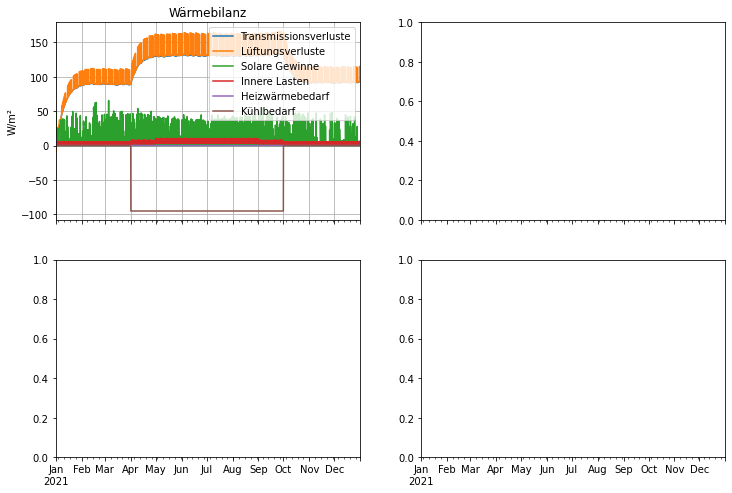

C:\Users\Simon Schneider\PycharmProjects\MEE1-3-PEQ\Exercises\solutions\Simulation.py:314: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


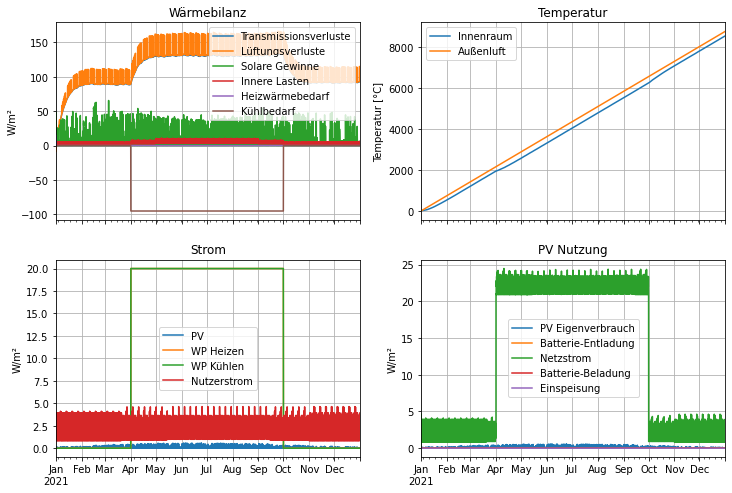

In [13]:
test.plot()
Qx = pn.pane.Bokeh(heat_balance(test.df_heat_balance))

In [14]:
battery_input.value

''

Defining the required inputs

In [15]:
import param

action = param.Action(lambda x: x.param.trigger("action"), label="Simulate!")
@param.depends("action")
def simulate():
    test.simulate()
    results = heat_balance(test.df_heat_balance)
    return results
